<a href="https://colab.research.google.com/github/R3gm/Colab-resources/blob/main/Segmentation_demos__metaseg_segGPT_Prismer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Showcasing Implemented Models for Image and Video Segmentation

| More | Link |
| ----------- | ---- |
| 🔥 Discover More Colab Notebooks | [![GitHub Repository](https://img.shields.io/badge/GitHub-Repository-black?style=flat-square&logo=github)](https://github.com/R3gm/Colab-resources/) |


# METASEG

MetaSeg: Packaged version of the Segment Anything repository

| Code Credits | Link |
| ----------- | ---- |
| 🎉 Repository | [![GitHub Repository](https://img.shields.io/github/stars/kadirnar/segment-anything-video?style=social)](https://github.com/kadirnar/segment-anything-video) |
| 🚀 Online inference | [![Hugging Face Spaces](https://img.shields.io/badge/%F0%9F%A4%97%20Hugging%20Face-Spaces-blue)](https://huggingface.co/spaces/ArtGAN/Segment-Anything-Video) |


In [ ]:
!pip install metaseg yt_dlp moviepy sahi yolov5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 38.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.0/104.0 kB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.3/953.3 kB 32.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.6/193.6 kB 21.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 52.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 15.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 89.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.3/88.3 kB 11.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 25.0 MB/s eta 0:00:00
  

In [ ]:
import moviepy.editor as mp
import matplotlib.pyplot as plt
import cv2
from IPython.display import Image
import numpy as np

%matplotlib inline

def show_frames(video_path):

  video = mp.VideoFileClip(video_path)

  # duration of the video in seconds
  duration = video.duration
  # Set frames
  num_frames = 10
  # time interval between frames
  frame_interval = duration / num_frames
  # list to store extracted frames
  frames = []

  # Extract frames at regular intervals
  for i in range(num_frames):
      # Calculate the time of the current frame
      t = i * frame_interval
      # Get the frame at the specified time
      frame = video.get_frame(t)
      # Append the frame
      frames.append(frame)

  # Display the extracted frames
  for i, frame in enumerate(frames):
      plt.figure()
      plt.imshow(frame)
      plt.axis('off')
      plt.show()

In [ ]:
!wget https://raw.githubusercontent.com/obss/sahi/main/demo/demo_data/small-vehicles1.jpeg -O image.jpg

--2023-06-19 14:33:59--  https://raw.githubusercontent.com/obss/sahi/main/demo/demo_data/small-vehicles1.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 323344 (316K) [image/jpeg]
Saving to: ‘image.jpg’

image.jpg           100%[===================>] 315.77K  --.-KB/s    in 0.02s   

2023-06-19 14:33:59 (14.7 MB/s) - ‘image.jpg’ saved [323344/323344]



In [ ]:
#!wget -O image.jpg  https://img.freepik.com/free-photo/two-girls-walking-with-shopping-bags-city-streets-sunny-day_155003-14392.jpg?size=626&ext=jpg

--2023-06-09 18:16:06--  https://img.freepik.com/free-photo/two-girls-walking-with-shopping-bags-city-streets-sunny-day_155003-14392.jpg?size=626
Resolving img.freepik.com (img.freepik.com)... 23.77.172.248, 2600:141b:e800:1480::312e, 2600:141b:e800:148d::312e
Connecting to img.freepik.com (img.freepik.com)|23.77.172.248|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68211 (67K) [image/jpeg]
Saving to: ‘image.jpg’

image.jpg           100%[===================>]  66.61K  --.-KB/s    in 0.05s   

2023-06-09 18:16:07 (1.37 MB/s) - ‘image.jpg’ saved [68211/68211]



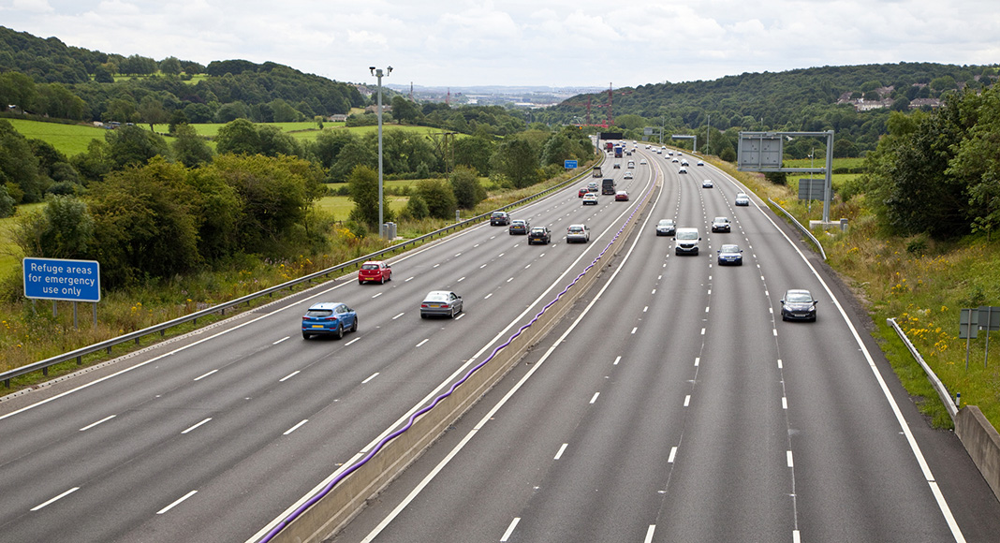

In [ ]:
Image("image.jpg")

## Segment a Image

In [ ]:
from metaseg import SegAutoMaskPredictor, SegManualMaskPredictor

# If gpu memory is not enough, reduce the points_per_side and points_per_batch.

# For image
results = SegAutoMaskPredictor().image_predict(
    source="image.jpg",
    model_type="vit_h", # vit_l, vit_h, vit_b
    points_per_side=16,
    points_per_batch=64,
    min_area=0,
    output_path="output.jpg",
    show=False,
    save=True,
)


vit_h model already exists as 'vit_h.pth'. Skipping download.


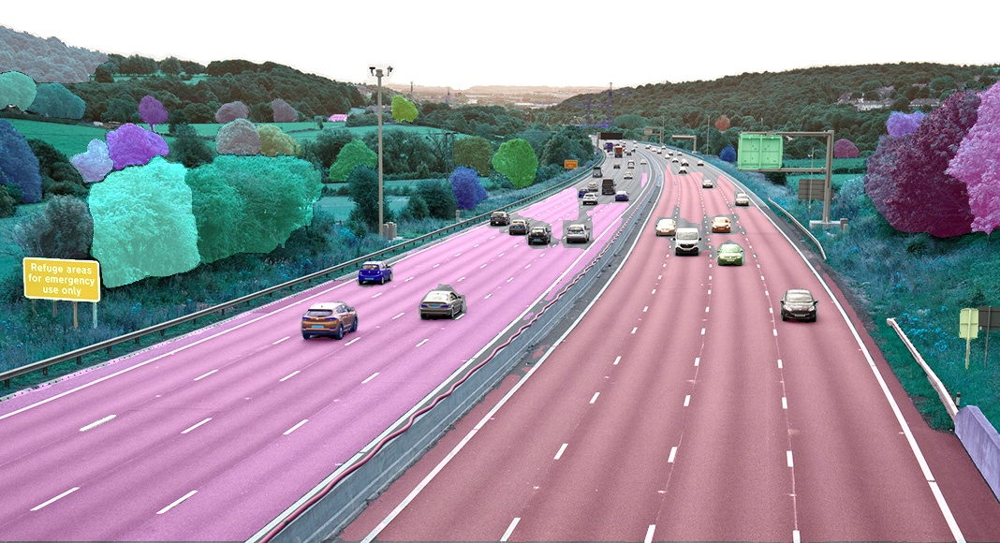

In [ ]:
Image("output.jpg")

##Segment a video

In [ ]:
!yt-dlp -f 'best[height<=480]' --merge-output-format mp4 -o 'video.mp4' https://www.youtube.com/watch?v=tPEE9ZwTmy0

[youtube] Extracting URL: https://www.youtube.com/watch?v=tPEE9ZwTmy0
[youtube] tPEE9ZwTmy0: Downloading webpage
[youtube] tPEE9ZwTmy0: Downloading android player API JSON
[info] tPEE9ZwTmy0: Downloading 1 format(s): 18
[download] Destination: video.mp4
[download] 100% of   43.48KiB in 00:00:00 at 169.10KiB/s


In [ ]:
from metaseg import SegAutoMaskPredictor, SegManualMaskPredictor

# For video
results = SegAutoMaskPredictor().video_predict(
    source="video.mp4",
    model_type="vit_h", # vit_l, vit_h, vit_b
    points_per_side=16,
    points_per_batch=64,
    min_area=5000,
    output_path="output.mp4",
)

  0%|          | 0/28 [00:00<?, ?it/s]

vit_h model already exists as 'vit_h.pth'. Skipping download.


100%|██████████| 28/28 [01:57<00:00,  4.20s/it]


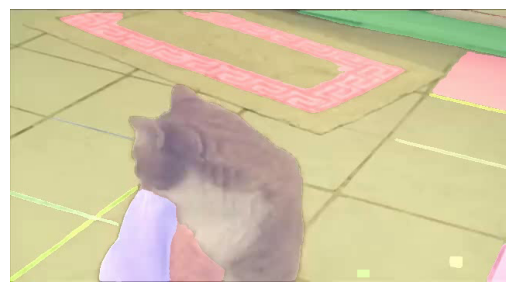

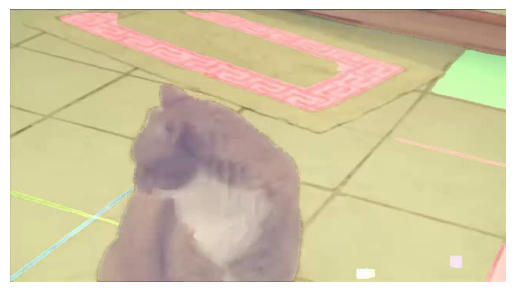

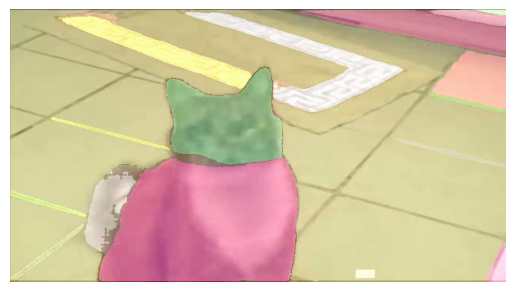

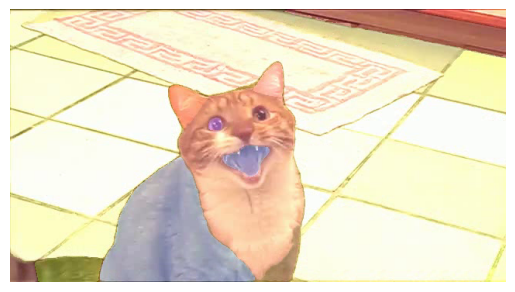

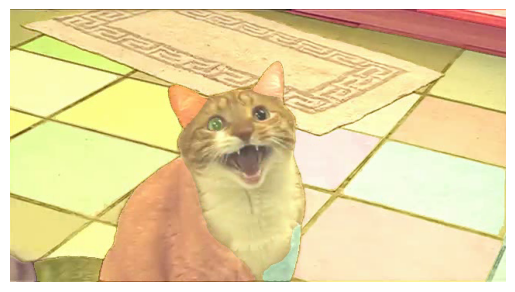

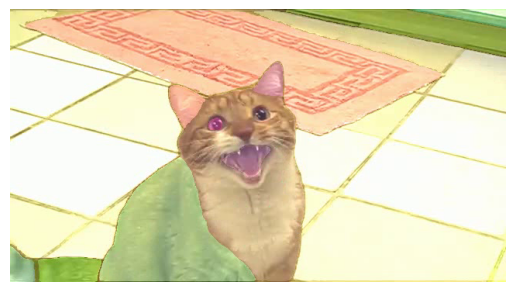

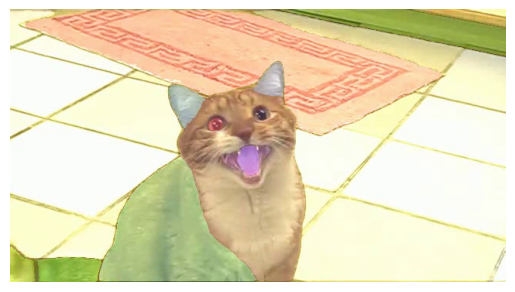

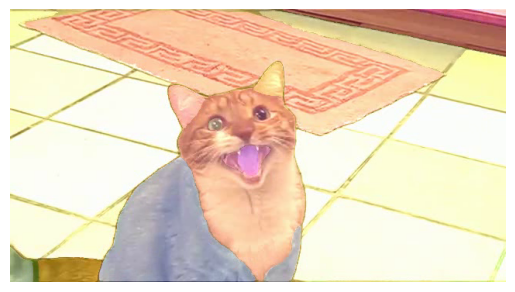

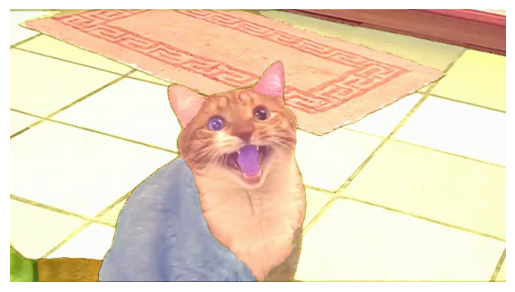

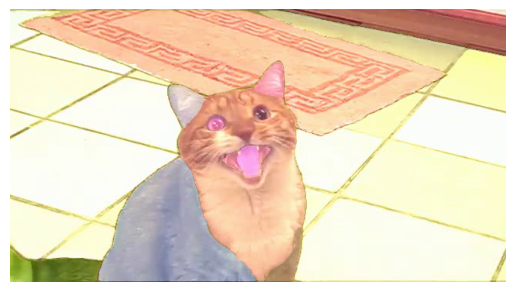

In [ ]:
show_frames('output.mp4')


## Box selection

In [ ]:
# For image
results = SegManualMaskPredictor().image_predict(
    source="image.jpg",
    model_type="vit_h", # vit_l, vit_h, vit_b
    #input_point=input_point_array,
    #input_label=[0, 1],
    input_box=[[100, 100, 200, 200], [100, 100, 200, 200]], #[250, 400, 400, 300], # or [[100, 100, 200, 200], [100, 100, 200, 200]]
    multimask_output=False,
    random_color=True,
    #show=False,
    save=True,
    output_path="output.jpg"
)


vit_h model already exists as 'vit_h.pth'. Skipping download.


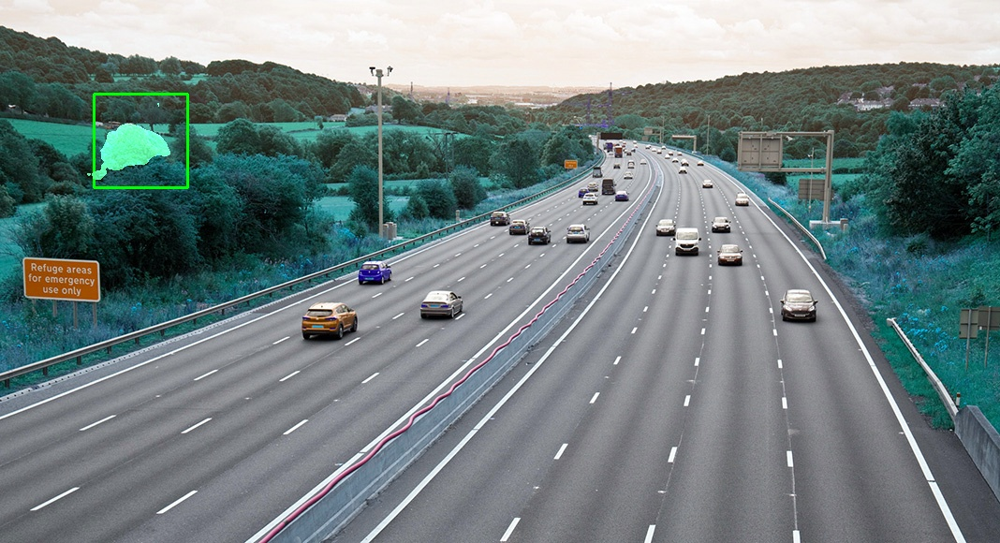

In [ ]:
Image("output.jpg")

In [ ]:
# For video
!rm output.mp4

results = SegManualMaskPredictor().video_predict(
    source="video.mp4",
    model_type="vit_h", # vit_l, vit_h, vit_b .. b <l <h
    #input_point=input_point_array,
    input_label=[0, 1],
    input_box=[200, 100, 450, 550],
    multimask_output=False,
    random_color=True,
    output_path="output.mp4",
)

  0%|          | 0/28 [00:00<?, ?it/s]

vit_h model already exists as 'vit_h.pth'. Skipping download.


100%|██████████| 28/28 [01:21<00:00,  2.90s/it]


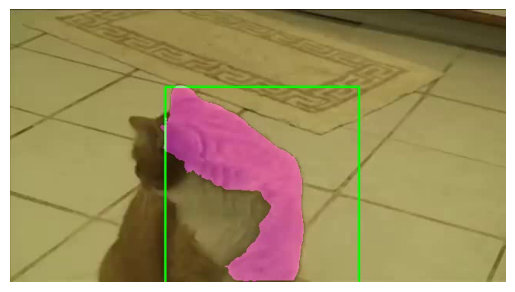

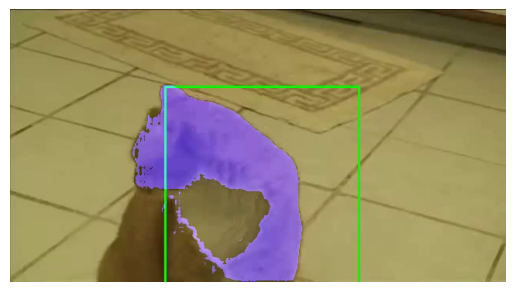

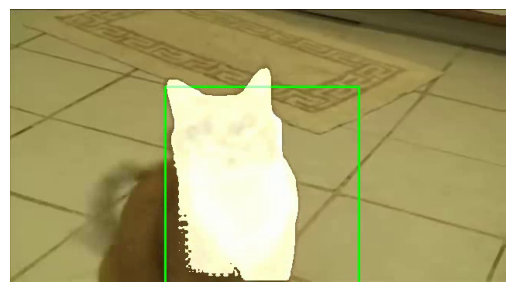

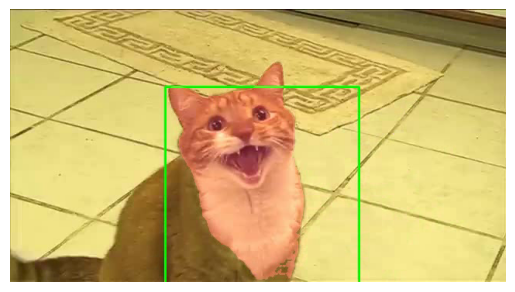

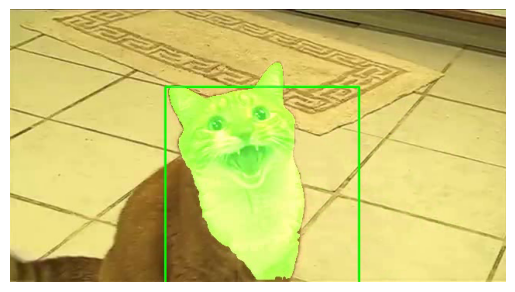

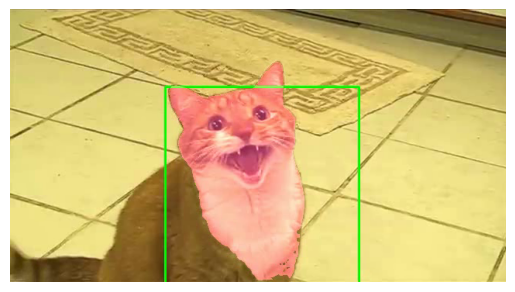

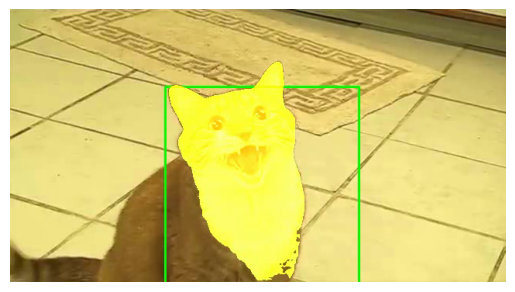

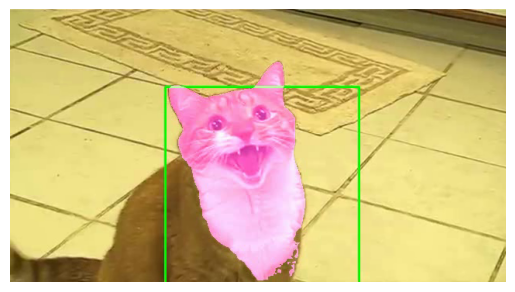

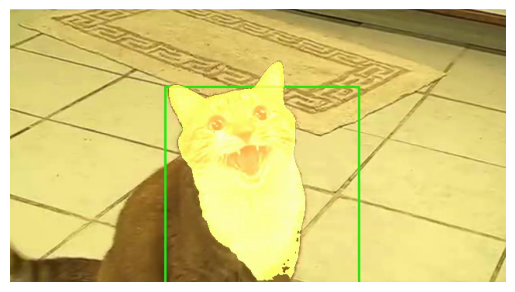

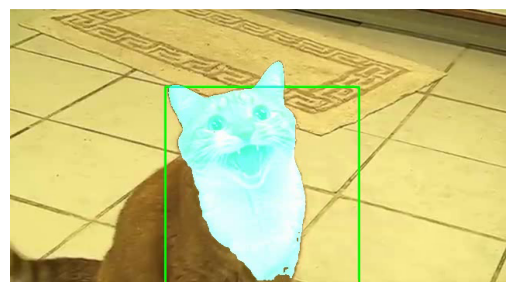

In [ ]:
show_frames('output.mp4')

- Solved bug -> point reference

<td class="d-block comment-body markdown-body  js-comment-body">
          <p dir="auto"><a class="user-mention notranslate" data-hovercard-type="user" data-hovercard-url="/users/royzhou007/hovercard" data-octo-click="hovercard-link-click" data-octo-dimensions="link_type:self" href="https://github.com/royzhou007">@royzhou007</a></p>
<p dir="auto">Change <a href="https://github.com/kadirnar/segment-anything-video/blob/8812f5a777f139896320d04817842fb70ecd57ed/metaseg/utils/transforms.py#L40">this line </a>to:         <code class="notranslate">coords = np.array(deepcopy(coords), dtype=np.float32)</code></p>
<p dir="auto">That resolved my issue :)</p>
      </td>




```
coords = np.array(coords, dtype=np.float32)
```

In [ ]:
#
input_point = [[300, 300], [500, 500]]
input_point_array = np.array(input_point)

[[300 300]
 [500 500]]


## SAHI + Segment Anything

Performing prediction on 15 number of slices.
vit_b model already exists as 'vit_b.pth'. Skipping download.


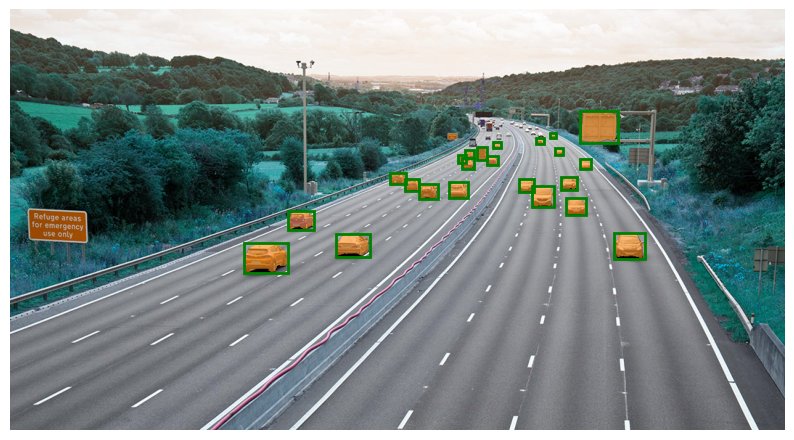

In [ ]:
from metaseg.sahi_predict import SahiAutoSegmentation, sahi_sliced_predict

image_path = "image.jpg"
boxes = sahi_sliced_predict(
    image_path=image_path,
    detection_model_type="yolov5", #yolov8, detectron2, mmdetection, torchvision
    detection_model_path="yolov5l6.pt",
    conf_th=0.25,
    image_size=1280,
    slice_height=256,
    slice_width=256,
    overlap_height_ratio=0.2,
    overlap_width_ratio=0.2,
)

SahiAutoSegmentation().predict(
    source=image_path,
    model_type="vit_h",
    input_box=boxes,
    multimask_output=False,
    random_color=False,
    show=False,
    save=True,
)

# SegGPT: Segmenting Everything In Context

SegGPT is a generalist model for segmenting everything in context. With only one single model, SegGPT can perform arbitrary segmentation tasks in images or videos via in-context inference, such as object instance, stuff, part, contour, and text.

| Code Credits | Link |
| ----------- | ---- |
| 🎉 Repository | [![GitHub Repository](https://img.shields.io/github/stars/baaivision/Painter?style=social)](https://github.com/baaivision/Painter) |
| 🚀 Online inference | [![Hugging Face Spaces](https://img.shields.io/badge/%F0%9F%A4%97%20Hugging%20Face-Spaces-blue)](https://huggingface.co/spaces/BAAI/SegGPT) |

In [ ]:
!git clone https://github.com/baaivision/Painter
%cd Painter/SegGPT/SegGPT_inference
!wget https://huggingface.co/BAAI/SegGPT/resolve/main/seggpt_vit_large.pth
!pip install -r requirements.txt
!pip install timm==0.4.12

fatal: destination path 'Painter' already exists and is not an empty directory.
/content/Painter/SegGPT/SegGPT_inference
--2023-06-19 15:40:53--  https://huggingface.co/BAAI/SegGPT/resolve/main/seggpt_vit_large.pth
Resolving huggingface.co (huggingface.co)... 18.172.170.44, 18.172.170.70, 18.172.170.36, ...
Connecting to huggingface.co (huggingface.co)|18.172.170.44|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs.huggingface.co/repos/a0/5c/a05ca640d6e4f08b928489d7e7f80507590b071210c55fc80e463f64c139936c/59c74d1993ca50ac0ae968d9bbe5db453f50aa5d5c7c9564cce6011c18b16570?response-content-disposition=attachment%3B+filename*%3DUTF-8%27%27seggpt_vit_large.pth%3B+filename%3D%22seggpt_vit_large.pth%22%3B&Expires=1687448454&Policy=eyJTdGF0ZW1lbnQiOlt7IlJlc291cmNlIjoiaHR0cHM6Ly9jZG4tbGZzLmh1Z2dpbmdmYWNlLmNvL3JlcG9zL2EwLzVjL2EwNWNhNjQwZDZlNGYwOGI5Mjg0ODlkN2U3ZjgwNTA3NTkwYjA3MTIxMGM1NWZjODBlNDYzZjY0YzEzOTkzNmMvNTljNzRkMTk5M2NhNTBhYzBhZTk2OGQ5YmJlNWRiND

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

def show_images(image_paths, titles):
    fig, axes = plt.subplots(2, 2, figsize=(10, 10))

    for i, ax in enumerate(axes.flat):
        img = Image.open(image_paths[i])
        ax.imshow(img)
        ax.set_title(titles[i])
        ax.axis('off')

    plt.tight_layout()
    plt.show()

titles = [
    "Input Image",
    "Prompt Image",
    "Prompt Target",
    "Output Image"
]

Everything in an image with a prompt.

In [ ]:
%cd Painter/SegGPT/SegGPT_inference

!python seggpt_inference.py \
  --input_image examples/hmbb_2.jpg \
  --prompt_image examples/hmbb_1.jpg \
  --prompt_target examples/hmbb_1_target.png \
  --output_dir ./

/content/Painter/SegGPT/SegGPT_inference
Model loaded.
Finished.


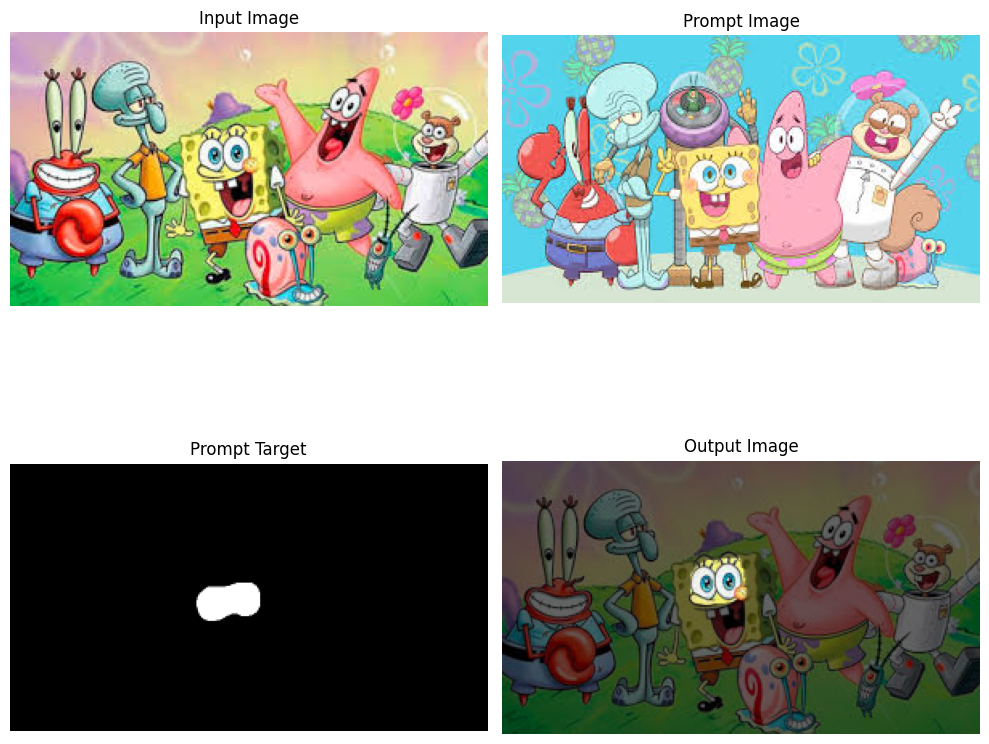

In [ ]:
image_paths = [
    "examples/hmbb_2.jpg",
    "examples/hmbb_1.jpg",
    "examples/hmbb_1_target.png",
    "output_hmbb_2.png"
]

show_images(image_paths, titles)

Everything in an image with multiple prompts.

In [ ]:
!python seggpt_inference.py \
  --input_image examples/hmbb_3.jpg \
  --prompt_image examples/hmbb_1.jpg examples/hmbb_2.jpg \
  --prompt_target examples/hmbb_1_target.png examples/hmbb_2_target.png \
  --output_dir ./

Model loaded.
Finished.


Everything in a video using a prompt image.

In [ ]:
!python seggpt_inference.py \
  --input_video examples/video_1.mp4 \
  --prompt_image examples/video_1.jpg \
  --prompt_target examples/video_1_target.png \
  --output_dir ./

Model loaded.
Finished.


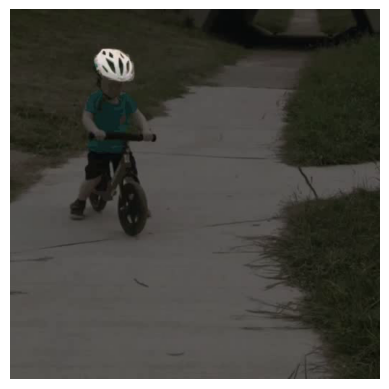

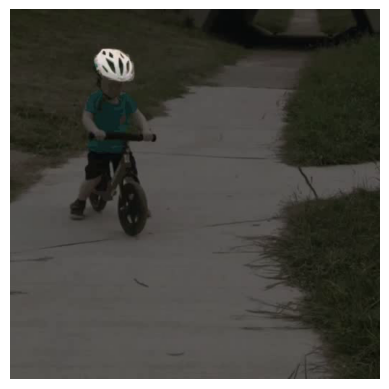

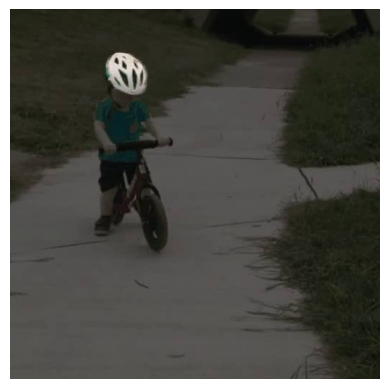

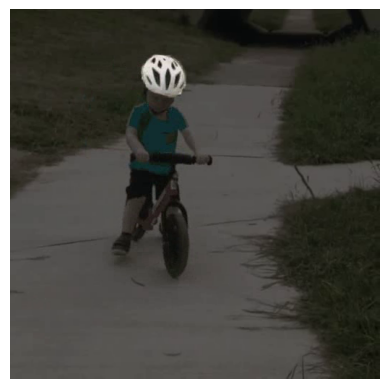

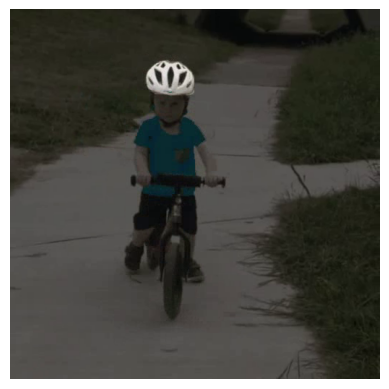

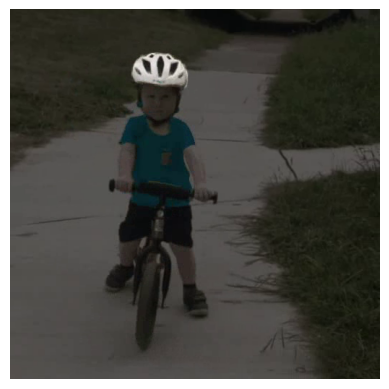

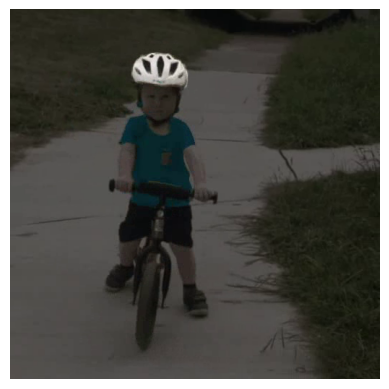

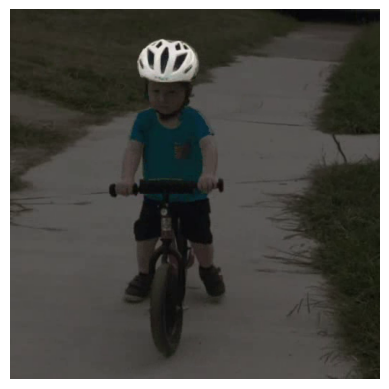

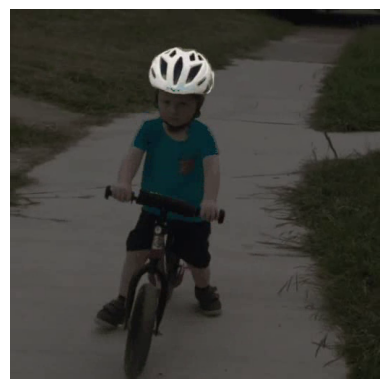

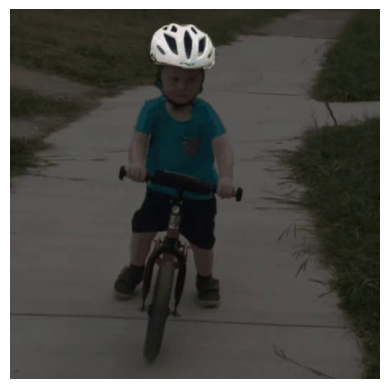

In [ ]:

# run the cell with the function show_frames
show_frames('/content/Painter/SegGPT/SegGPT_inference/output_video_1.mp4')

Everything in a video using the first frame as the prompt.

In [ ]:
!python seggpt_inference.py \
  --input_video examples/video_1.mp4 \
  --prompt_target examples/video_1_target.png \
  --output_dir ./

Model loaded.
Finished.


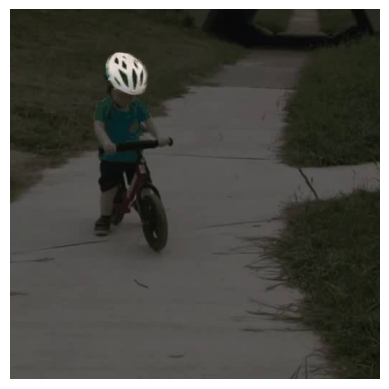

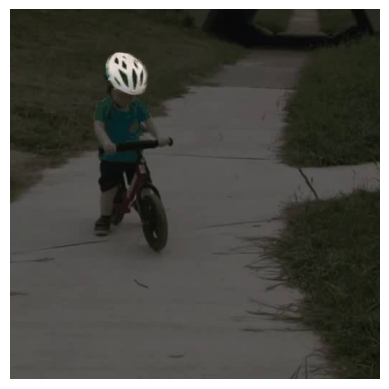

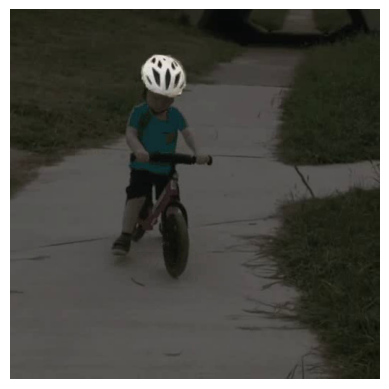

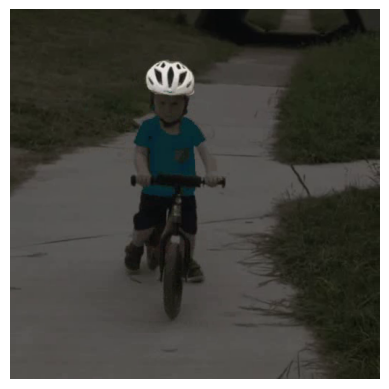

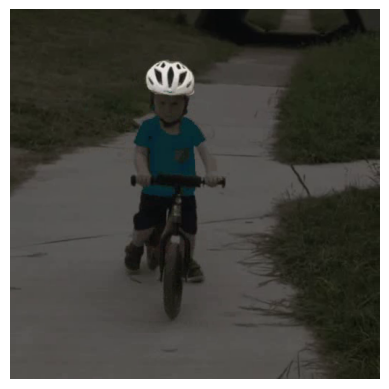

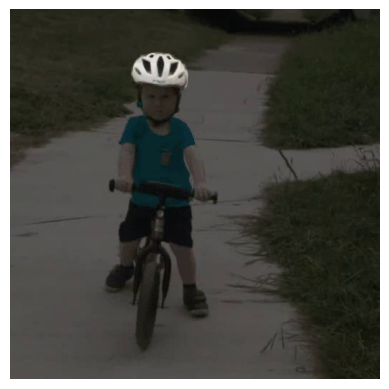

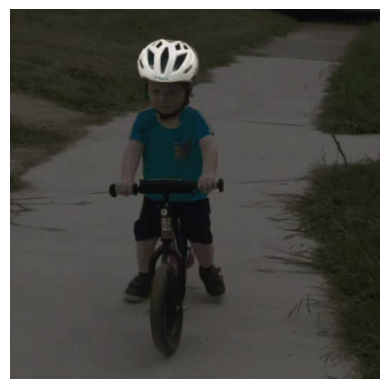

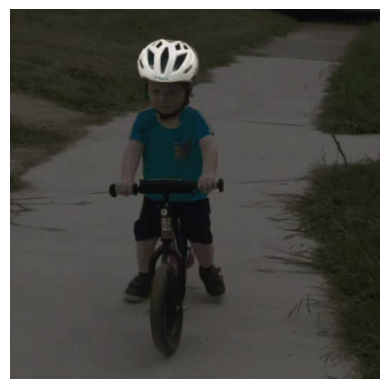

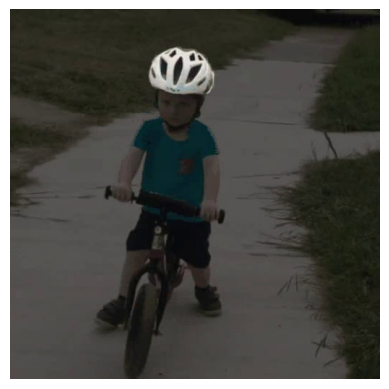

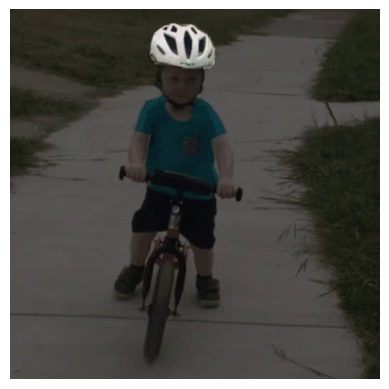

In [ ]:
show_frames('/content/Painter/SegGPT/SegGPT_inference/output_video_1.mp4')

Processing a long video with prompts from both a target image and the predictions of the previous NUM_FRAMES frames.

In [ ]:
NUM_FRAMES=4
!python seggpt_inference.py \
  --input_video examples/video_3.mp4 \
  --prompt_target examples/video_3_target.png \
  --num_frames $NUM_FRAMES \
  --output_dir ./

Model loaded.
Finished.


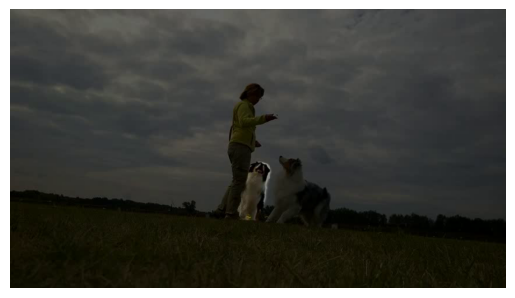

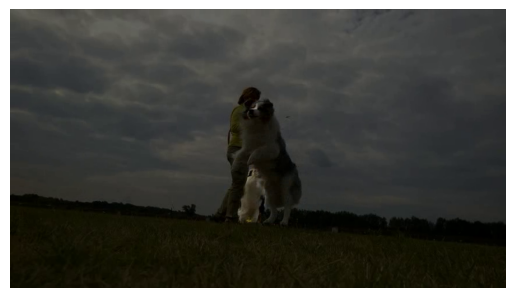

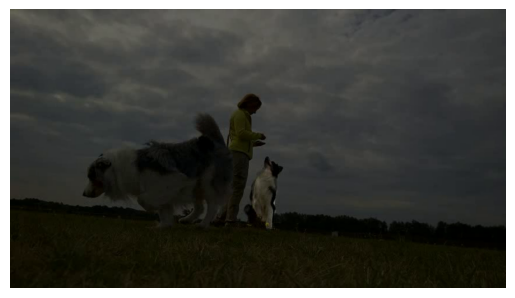

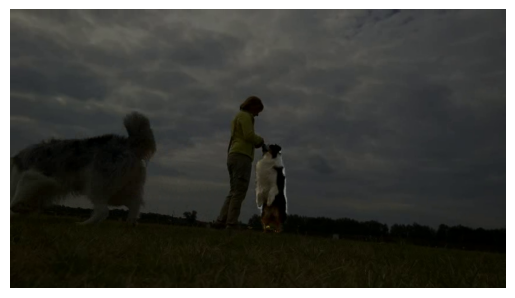

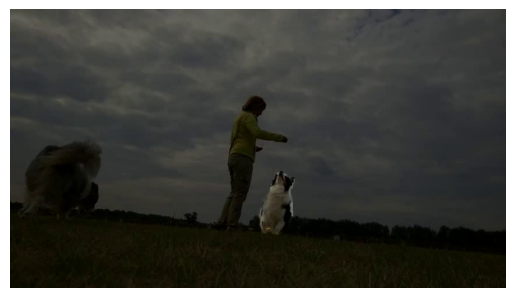

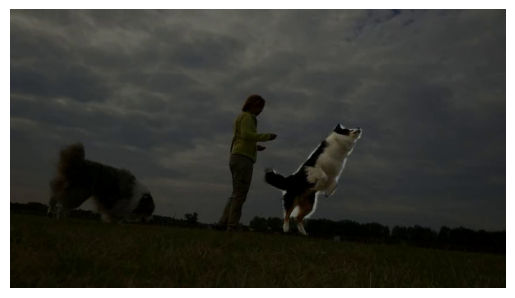

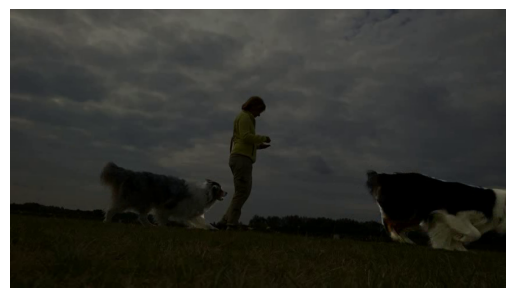

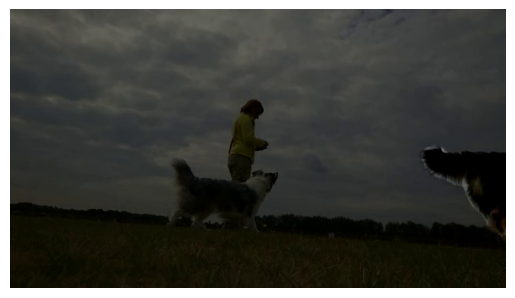

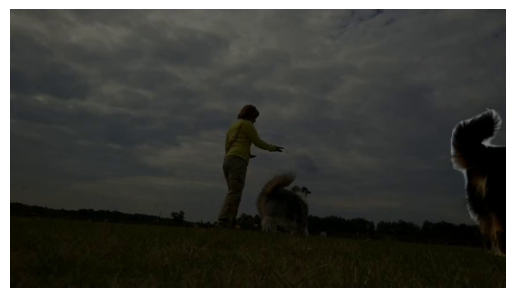

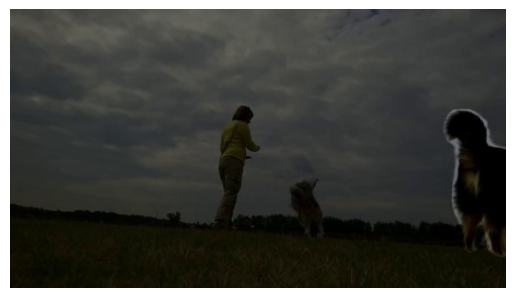

In [ ]:
show_frames('/content/Painter/SegGPT/SegGPT_inference/output_video_3.mp4')

# Prismer: A Vision-Language Model with An Ensemble of Experts


| Code Credits | Link |
| ----------- | ---- |
| 🎉 Repository | [![GitHub Repository](https://img.shields.io/github/stars/NVlabs/Prismer?style=social)](https://github.com/NVlabs/Prismer) |
| 🚀 Online inference | [![Hugging Face Spaces](https://img.shields.io/badge/%F0%9F%A4%97%20Hugging%20Face-Spaces-blue)](https://huggingface.co/spaces/shikunl/prismer) |

In [ ]:
!git clone https://github.com/NVlabs/prismer.git
%cd prismer
!pip install -r requirements.txt
!sudo pip install numpy --upgrade --ignore-installed

Cloning into 'prismer'...
remote: Enumerating objects: 415, done.
remote: Counting objects: 100% (59/59), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 415 (delta 41), reused 38 (delta 30), pack-reused 356
Receiving objects: 100% (415/415), 4.34 MiB | 8.86 MiB/s, done.
Resolving deltas: 100% (149/149), done.
/content/prismer
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git (to revision 5aeb252b194b93dc2879b4ac34bc51a31b5aee13) to /tmp/pip-req-build-uqr3eb8o
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-uqr3eb8o
  Running command git rev-parse -q --verify 'sha^5aeb252b194b93dc2879b4ac34bc51a31b5aee13'
  Running command git fetch -q https://github.com/facebookresearch/detectron2.git 5aeb252b194b93dc2879b4ac34bc51a31b5aee13
  Running command git checkout -q 5aeb252b194b93dc2879b4

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached numpy-1.25.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.6 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imbalanced-learn 0.10.1 requires scikit-learn>=1.0.2, but you have scikit-learn 0.24.2 which is incompatible.
numba 0.56.4 requires numpy<1.24,>=1.18, but you have numpy 1.25.0 which is incompatible.
tensorflow 2.12.0 requires numpy<1.24,>=1.22, but you have numpy 1.25.0 which is incompatible.
yellowbrick 1.5 requires scikit-learn>=1.0.0, but you have scikit-learn 0.24.2 which is incompatible.


`RESTART RUNTIME`

In [ ]:
# config experts
#experts/segmentation/mask2former/modeling/pixel_decoder/ops
%cd /content/prismer/experts/segmentation/mask2former/modeling/pixel_decoder/ops
!sh make.sh

/content/prismer/experts/segmentation/mask2former/modeling/pixel_decoder/ops
running build
running build_py
creating build
creating build/lib.linux-x86_64-cpython-310
creating build/lib.linux-x86_64-cpython-310/modules
copying modules/ms_deform_attn.py -> build/lib.linux-x86_64-cpython-310/modules
copying modules/__init__.py -> build/lib.linux-x86_64-cpython-310/modules
creating build/lib.linux-x86_64-cpython-310/functions
copying functions/__init__.py -> build/lib.linux-x86_64-cpython-310/functions
copying functions/ms_deform_attn_func.py -> build/lib.linux-x86_64-cpython-310/functions
running build_ext
/usr/local/lib/python3.10/dist-packages/torch/utils/cpp_extension.py:476: UserWarning: Attempted to use ninja as the BuildExtension backend but we could not find ninja.. Falling back to using the slow distutils backend.
  warnings.warn(msg.format('we could not find ninja.'))
/usr/local/lib/python3.10/dist-packages/torch/utils/cpp_extension.py:398: UserWarning: There are no x86_64-linux

In [ ]:
%cd /content/prismer

/content/prismer


In [ ]:
MODEL_NAME = "prismer_base"
Caption_model = "caption_prismer_base"

In [ ]:
#!python download_checkpoints.py --download_models={MODEL_NAME}
#!python download_checkpoints.py --download_experts=True
!python download_checkpoints.py --download_experts=True --hide_tqdm=True
!python download_checkpoints.py --download_models={Caption_model} --hide_tqdm=True

Traceback (most recent call last):
  File "/content/prismer/download_checkpoints.py", line 126, in <module>
    Fire(download_checkpoints)
  File "/usr/local/lib/python3.10/dist-packages/fire/core.py", line 141, in Fire
    component_trace = _Fire(component, args, parsed_flag_args, context, name)
  File "/usr/local/lib/python3.10/dist-packages/fire/core.py", line 466, in _Fire
    component, remaining_args = _CallAndUpdateTrace(
  File "/usr/local/lib/python3.10/dist-packages/fire/core.py", line 681, in _CallAndUpdateTrace
    component = fn(*varargs, **kwargs)
  File "/content/prismer/download_checkpoints.py", line 63, in download_checkpoints
    assert download_experts or download_models, "Nothing to download."
AssertionError: Nothing to download.
Traceback (most recent call last):
  File "/content/prismer/download_checkpoints.py", line 126, in <module>
    Fire(download_checkpoints)
  File "/usr/local/lib/python3.10/dist-packages/fire/core.py", line 141, in Fire
    component_trace 

## Run demo

the files need to be in /content/prismer/helpers/images

In [ ]:
!python demo.py --exp_name {MODEL_NAME}

2023-06-19 18:03:08.394392: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-19 18:03:09.411609: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.
Moving 0 files to the new cache system
0it [00:00, ?it/s]
2023-06-19 18:03:14.432437: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our 

/content/prismer


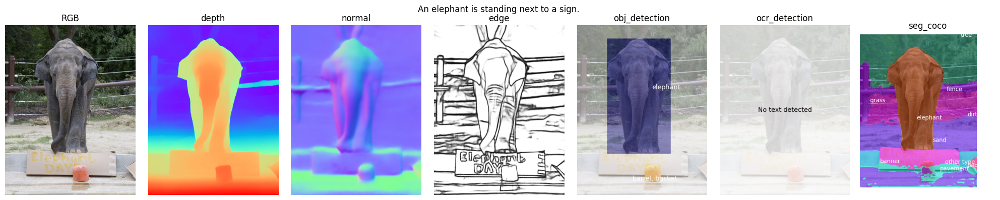

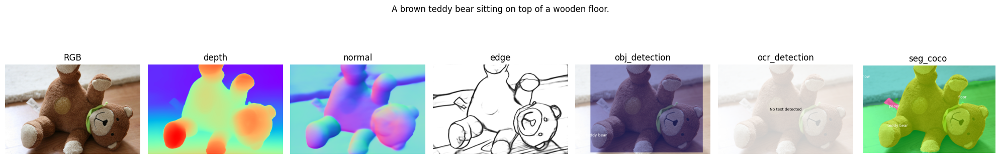

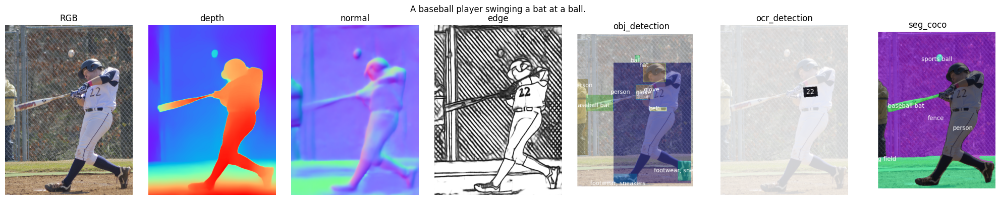

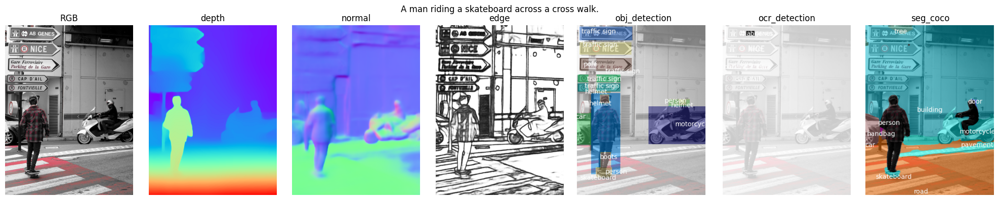

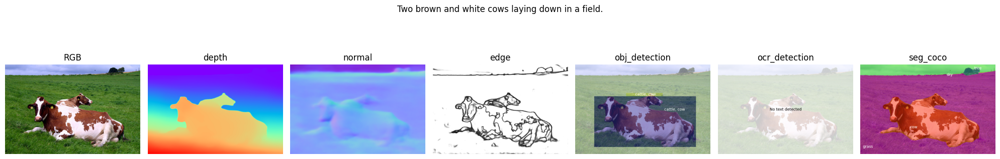

<Figure size 640x480 with 0 Axes>

In [ ]:
%cd /content/prismer
%run demo_vis.py